*****
# Set Directory

In [1]:
import os
from pathlib import Path
os.chdir(Path(os.getcwd()).parent)

print(f'Current working directory: {os.getcwd()}')
ROOT_DIR = os.getcwd()
print(f'Root directory: {ROOT_DIR}')

Current working directory: d:\Programing\drone-human-detection-and-counting-system
Root directory: d:\Programing\drone-human-detection-and-counting-system


****
# Imports

In [2]:
import sys
import cv2
import yaml
import shutil
import random
import warnings

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from tqdm import tqdm
from PIL import Image
from collections import defaultdict
from collections import defaultdict, Counter
from IPython.display import display, Image as IPImage, HTML

warnings.filterwarnings('ignore')

In [3]:
DATASET_PATH = Path("./dataset/VisDrone_Dataset")

In [6]:
for root, dirs, files in os.walk(DATASET_PATH):
    print(f'{root} : {len(files)} files')

dataset\VisDrone_Dataset : 1 files
dataset\VisDrone_Dataset\VisDrone2019-DET-test-challenge : 0 files
dataset\VisDrone_Dataset\VisDrone2019-DET-test-challenge\images : 1580 files
dataset\VisDrone_Dataset\VisDrone2019-DET-test-dev : 0 files
dataset\VisDrone_Dataset\VisDrone2019-DET-test-dev\images : 1610 files
dataset\VisDrone_Dataset\VisDrone2019-DET-test-dev\labels : 1610 files
dataset\VisDrone_Dataset\VisDrone2019-DET-train : 0 files
dataset\VisDrone_Dataset\VisDrone2019-DET-train\images : 6471 files
dataset\VisDrone_Dataset\VisDrone2019-DET-train\labels : 6471 files
dataset\VisDrone_Dataset\VisDrone2019-DET-val : 0 files
dataset\VisDrone_Dataset\VisDrone2019-DET-val\images : 548 files
dataset\VisDrone_Dataset\VisDrone2019-DET-val\labels : 548 files


In [7]:
# load yaml config file
with open(Path.joinpath(DATASET_PATH, "visdrone.yaml"), "r") as f:
    ds_config = yaml.safe_load(f)
ds_config

{'path': './VisDrone_Dataset',
 'train': 'VisDrone2019-DET-train/images',
 'val': 'VisDrone2019-DET-val/images',
 'test': 'VisDrone2019-DET-test-dev/images',
 'nc': 10,
 'names': {0: 'pedestrian',
  1: 'people',
  2: 'bicycle',
  3: 'car',
  4: 'van',
  5: 'truck',
  6: 'tricycle',
  7: 'awning-tricycle',
  8: 'bus',
  9: 'motor'}}

*****
# EDA

In [8]:
dir_paths = {
    "train_img": Path.joinpath(DATASET_PATH, "VisDrone2019-DET-train/images"),
    "train_labels": Path.joinpath(DATASET_PATH, "VisDrone2019-DET-train/labels"),
    "val_img": Path.joinpath(DATASET_PATH, "VisDrone2019-DET-val/images"),
    "val_labels": Path.joinpath(DATASET_PATH, "VisDrone2019-DET-val/labels"),
    "test_img": Path.joinpath(DATASET_PATH, "VisDrone2019-DET-test-dev/images"),
    "test_labels": Path.joinpath(DATASET_PATH, "VisDrone2019-DET-test-dev/labels"),
}

classes = ds_config['names']

In [9]:
dir_paths

{'train_img': WindowsPath('dataset/VisDrone_Dataset/VisDrone2019-DET-train/images'),
 'train_labels': WindowsPath('dataset/VisDrone_Dataset/VisDrone2019-DET-train/labels'),
 'val_img': WindowsPath('dataset/VisDrone_Dataset/VisDrone2019-DET-val/images'),
 'val_labels': WindowsPath('dataset/VisDrone_Dataset/VisDrone2019-DET-val/labels'),
 'test_img': WindowsPath('dataset/VisDrone_Dataset/VisDrone2019-DET-test-dev/images'),
 'test_labels': WindowsPath('dataset/VisDrone_Dataset/VisDrone2019-DET-test-dev/labels')}

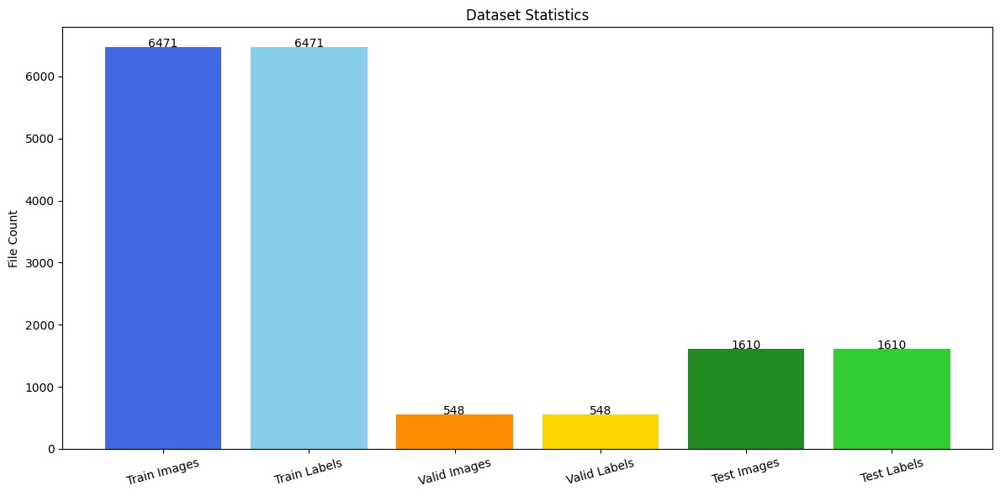

Checking image-label consistency...

Train: OK
Valid: OK
Test: OK


In [10]:
def plot_dataset_stats(dir_paths):
    stats = {
        "Train Images": len(os.listdir(dir_paths["train_img"])),
        "Train Labels": len(os.listdir(dir_paths["train_labels"])),

        "Valid Images": len(os.listdir(dir_paths["val_img"])),
        "Valid Labels": len(os.listdir(dir_paths["val_labels"])),

        "Test Images": len(os.listdir(dir_paths["test_img"])),
        "Test Labels": len(os.listdir(dir_paths["test_labels"]))
    }
    names = list(stats.keys())
    counts = list(stats.values())

    plt.figure(figsize=(12, 6))
    bars = plt.bar(names, counts, color=["royalblue", "skyblue", "darkorange", "gold", "forestgreen", "limegreen"])
    # Add value labels on top
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, height + 5, str(height), ha='center')
    plt.title("Dataset Statistics")
    plt.ylabel("File Count")
    plt.xticks(rotation=15)
    plt.tight_layout()
    plt.show()

    # Check mismatch
    print("Checking image-label consistency...\n")
    splits = [
        ("Train", stats["Train Images"], stats["Train Labels"]),
        ("Valid", stats["Valid Images"], stats["Valid Labels"]),
        ("Test", stats["Test Images"], stats["Test Labels"])
    ]
    for split, img_count, label_count in splits:
        if img_count == label_count:
            print(f"{split}: OK")
        else:
            print(f"{split}: Mismatch (Images={img_count}, Labels={label_count})")

plot_dataset_stats(dir_paths)

In [11]:
def plot_dataset_images(img_path, label_path, num_images=8):
    image_files = random.sample(list(img_path.iterdir()), num_images)

    fig, axes = plt.subplots(2, num_images, figsize=(5 * num_images, 12))

    for i, img_file in enumerate(image_files):
        # ---------------- RAW IMAGE ----------------
        image = cv2.imread(str(img_file))
        raw_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        axes[0, i].imshow(raw_img)
        axes[0, i].set_title("Raw")
        axes[0, i].axis("off")

        # ---------------- IMAGE WITH LABEL ----------------
        boxed_img = image.copy()
        h_img, w_img = boxed_img.shape[:2]

        label_file = label_path / f"{img_file.stem}.txt"
        if label_file.exists():
            with open(label_file, "r") as f:
                lines = f.readlines()
            
            for line in lines:
                class_id, x_center, y_center, w, h = map(
                    float,
                    line.strip().split()
                )
                # Convert YOLO -> pixel
                x_center *= w_img
                y_center *= h_img
                w *= w_img
                h *= h_img
                x1 = int(x_center - w / 2)
                y1 = int(y_center - h / 2)
                x2 = int(x_center + w / 2)
                y2 = int(y_center + h / 2)

                cv2.rectangle(boxed_img, (x1, y1), (x2, y2), (0, 255, 0), 2)
                cv2.putText(boxed_img, str(int(class_id)), (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

        boxed_img = cv2.cvtColor(boxed_img, cv2.COLOR_BGR2RGB)
        axes[1, i].imshow(boxed_img)
        axes[1, i].set_title("With Labels")
        axes[1, i].axis("off")

    plt.tight_layout()
    plt.show()

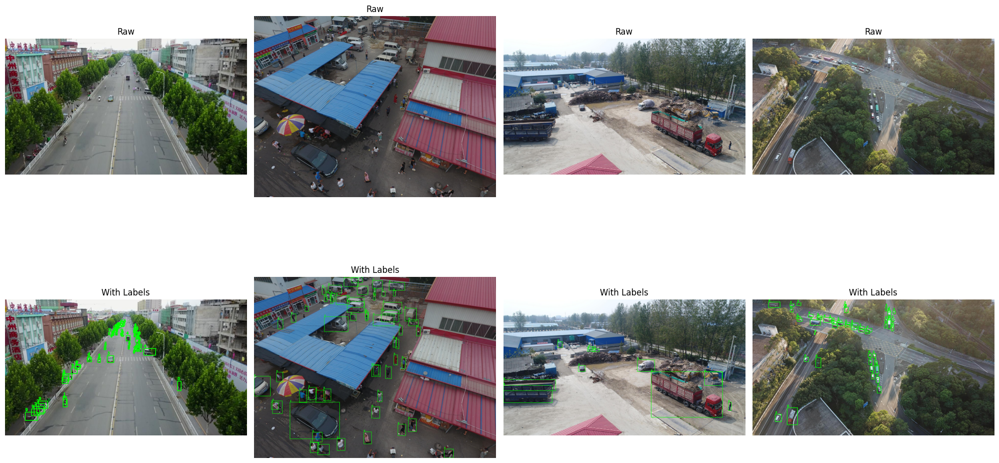

In [13]:
plot_dataset_images(
    dir_paths['train_img'],
    dir_paths['train_labels'],
    num_images=4
)

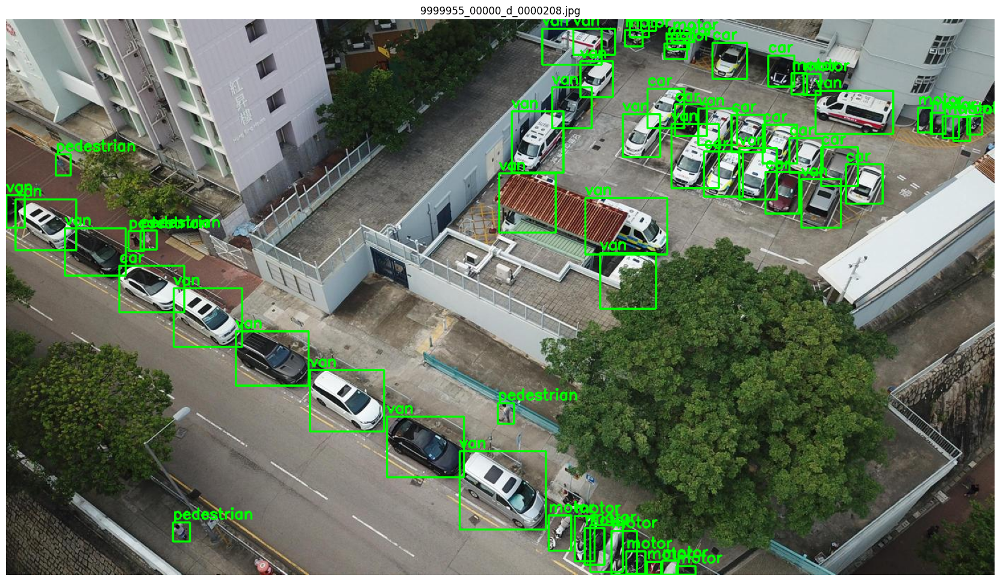

In [14]:
def plot_random_image(img_path, label_path, class_names):
    img_file = random.choice(list(img_path.iterdir()))

    image = cv2.imread(str(img_file))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    boxed_img = image.copy()
    h_img, w_img = boxed_img.shape[:2]

    # Corresponding label file
    label_file = label_path / f"{img_file.stem}.txt"

    if label_file.exists():
        with open(label_file, "r") as f:
            lines = f.readlines()
        for line in lines:
            class_id, x_center, y_center, w, h = map(float, line.strip().split())

            # YOLO -> pixel coordinates
            x_center *= w_img
            y_center *= h_img
            w *= w_img
            h *= h_img

            x1 = int(x_center - w / 2)
            y1 = int(y_center - h / 2)
            x2 = int(x_center + w / 2)
            y2 = int(y_center + h / 2)
            class_name = class_names[int(class_id)]
            # Draw bounding box
            cv2.rectangle(boxed_img, (x1, y1), (x2, y2), (0, 255, 0), 2)
            # Put class name
            cv2.putText(boxed_img, class_name, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)

    plt.figure(figsize=(26, 12))
    plt.imshow(boxed_img)
    plt.title(img_file.name)
    plt.axis("off")
    plt.show()
plot_random_image(dir_paths['train_img'], dir_paths['train_labels'], classes)

In [15]:
classes

{0: 'pedestrian',
 1: 'people',
 2: 'bicycle',
 3: 'car',
 4: 'van',
 5: 'truck',
 6: 'tricycle',
 7: 'awning-tricycle',
 8: 'bus',
 9: 'motor'}

In [16]:
class_mapping = {
    0: 0, 
    1: 0,
    2: 1,
    3: 1, 
    4: 1, 
    5: 1,
    6: 1,
    7: 1, 
    8: 1, 
    9: 1,
}
new_classes = {0: "human", 1: "car"}


In [17]:
def update_labels(label_path, class_mapping, skip_classes=None):
    skip_classes = skip_classes or set()
    label_dir = Path(label_path)
    txt_files = list(label_dir.glob("*.txt"))
    for txt in tqdm(txt_files, desc="Updating labels"):
        updated_lines = []
        for line in txt.read_text(encoding="utf-8").splitlines():
            parts = line.strip().split()
            if not parts:
                continue
            old_id = int(parts[0])
            if old_id in skip_classes or old_id not in class_mapping:
                continue
            parts[0] = str(class_mapping[old_id])
            updated_lines.append(" ".join(parts) + "\n")
        txt.write_text("".join(updated_lines), encoding="utf-8")
    print(f"Updated {len(txt_files)} files in {label_path}")


In [18]:
_sample = next(dir_paths["train_labels"].glob("*.txt"), None)
_needs_remap = False
if _sample:
    for _line in _sample.read_text(encoding="utf-8").splitlines():
        if _line.strip():
            _needs_remap = int(_line.split()[0]) > 1
            break
if _needs_remap:
    update_labels(dir_paths["train_labels"], class_mapping)
    update_labels(dir_paths["val_labels"], class_mapping)
    update_labels(dir_paths["test_labels"], class_mapping)
else:
    print("Labels already 2-class — skipping class remap.")


Updating labels: 100%|██████████| 6471/6471 [00:55<00:00, 117.58it/s]


Updated 6471 files in dataset\VisDrone_Dataset\VisDrone2019-DET-train\labels


Updating labels: 100%|██████████| 548/548 [00:07<00:00, 68.51it/s] 


Updated 548 files in dataset\VisDrone_Dataset\VisDrone2019-DET-val\labels


Updating labels: 100%|██████████| 1610/1610 [00:16<00:00, 96.58it/s] 

Updated 1610 files in dataset\VisDrone_Dataset\VisDrone2019-DET-test-dev\labels


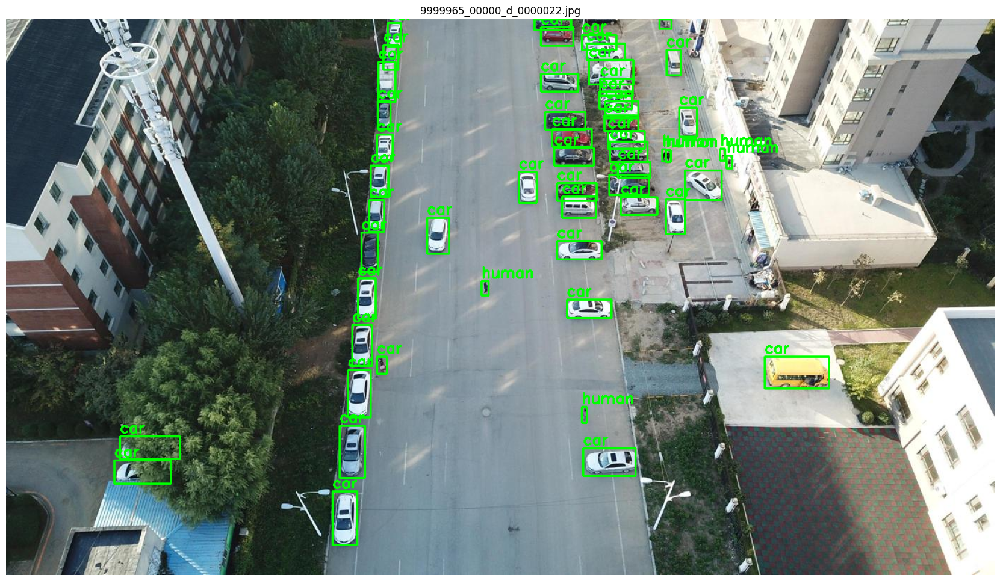

In [19]:
plot_random_image(dir_paths['train_img'], dir_paths['train_labels'], new_classes)

### Resolution stats

In [20]:
widths, heights = [], []

for img in os.listdir(dir_paths['train_img']):
    img_path = os.path.join(dir_paths['train_img'], img)
    img = Image.open(img_path)
    w, h = img.size
    widths.append(w)
    heights.append(h)

print(f"Total images: {len(widths)}")

print("Width stats:")
print("Min:", min(widths))
print("Max:", max(widths))
print("Avg:", sum(widths)/len(widths))

print("\nHeight stats:")
print("Min:", min(heights))
print("Max:", max(heights))
print("Avg:", sum(heights)/len(heights))

Total images: 6471
Width stats:
Min: 480
Max: 2000
Avg: 1519.8895070313708

Height stats:
Min: 360
Max: 1500
Avg: 1002.3970020089631


In [21]:
vwidths, vheights = [], []

for img in os.listdir(dir_paths['val_img']):
    img_path = os.path.join(dir_paths['val_img'], img)
    img = Image.open(img_path)
    w, h = img.size
    vwidths.append(w)
    vheights.append(h)

print(f"Total images: {len(vwidths)}")

print("Width stats:")
print("Min:", min(vwidths))
print("Max:", max(vwidths))
print("Avg:", sum(vwidths)/len(vwidths))

print("\nHeight stats:")
print("Min:", min(vheights))
print("Max:", max(vheights))
print("Avg:", sum(vheights)/len(vheights))

Total images: 548
Width stats:
Min: 960
Max: 1920
Avg: 1291.094890510949

Height stats:
Min: 540
Max: 1080
Avg: 726.2408759124088


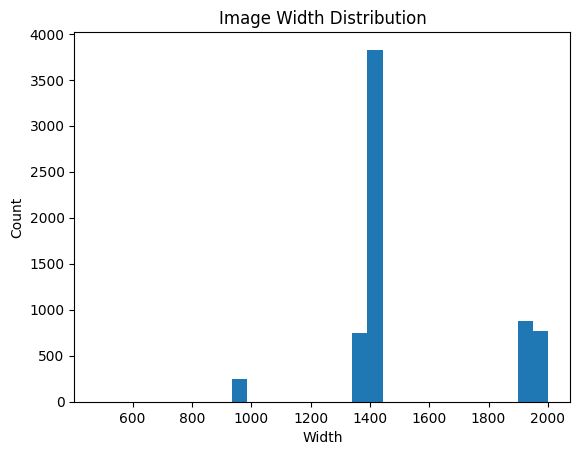

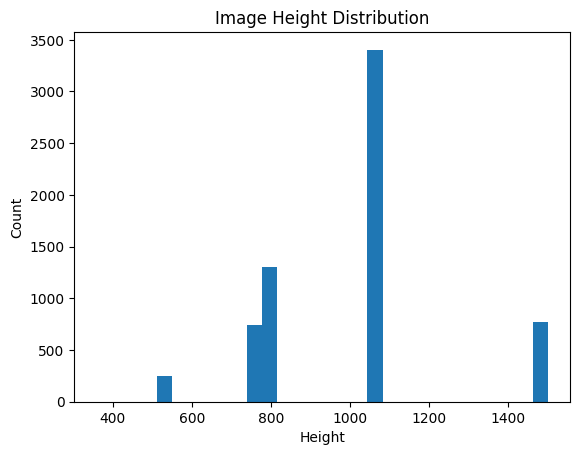

In [22]:
plt.hist(widths, bins=30)
plt.title("Image Width Distribution")
plt.xlabel("Width")
plt.ylabel("Count")
plt.show()

plt.hist(heights, bins=30)
plt.title("Image Height Distribution")
plt.xlabel("Height")
plt.ylabel("Count")
plt.show()

### Box stats

Total boxes: 343205
Avg bbox area: 0.0015348046318042394
Min area: 0.0
Max area: 0.302962110496


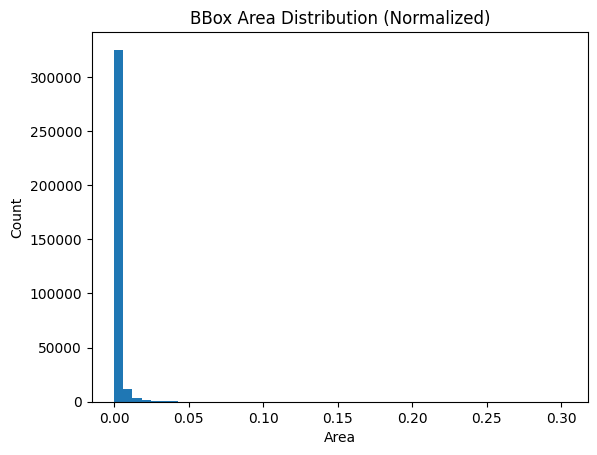

In [23]:
label_dir = dir_paths['train_labels']

bbox_areas = []
bbox_widths = []
bbox_heights = []
aspect_ratios = []

for file in os.listdir(label_dir):
    file_path = os.path.join(label_dir, file)

    with open(file_path, "r") as f:
        lines = f.readlines()

    for line in lines:
        parts = line.strip().split()
        if len(parts) != 5:
            continue

        _, xc, yc, w, h = map(float, parts)

        bbox_widths.append(w)
        bbox_heights.append(h)

        area = w * h
        bbox_areas.append(area)

        if h > 0:
            aspect_ratios.append(w / h)

print("Total boxes:", len(bbox_areas))
print("Avg bbox area:", np.mean(bbox_areas))
print("Min area:", np.min(bbox_areas))
print("Max area:", np.max(bbox_areas))

plt.hist(bbox_areas, bins=50)
plt.title("BBox Area Distribution (Normalized)")
plt.xlabel("Area")
plt.ylabel("Count")
plt.show()

### Number of objects per image (density analysis)

In [24]:
objects_per_image = []

for file in os.listdir(label_dir):
    file_path = os.path.join(label_dir, file)

    with open(file_path, "r") as f:
        lines = f.readlines()

    objects_per_image.append(len(lines))

print("Avg objects per image:", np.mean(objects_per_image))
print("Max objects in one image:", np.max(objects_per_image))
print("Min objects in one image:", np.min(objects_per_image))

Avg objects per image: 53.037397620151445
Max objects in one image: 902
Min objects in one image: 1


In [25]:
sparse = sum(1 for x in objects_per_image if x <= 2)
medium = sum(1 for x in objects_per_image if 3 <= x <= 10)
crowded = sum(1 for x in objects_per_image if x > 10)

print("Sparse images:", sparse)
print("Medium density images:", medium)
print("Crowded images:", crowded)

Sparse images: 25
Medium density images: 399
Crowded images: 6047


### Class distribution + overlap ratio

In [27]:
class_counts = defaultdict(int)

for file in os.listdir(label_dir):
    file_path = os.path.join(label_dir, file)

    with open(file_path, "r") as f:
        lines = f.readlines()

    for line in lines:
        cls = int(line.strip().split()[0])
        class_counts[cls] += 1

print("Class distribution:")
for k, v in sorted(class_counts.items()):
    print(f"Class {k}: {v}")

Class distribution:
Class 0: 106396
Class 1: 236809


In [28]:
# validation set class distribution
vclass_counts = defaultdict(int)

for file in os.listdir(dir_paths['val_labels']):
    file_path = os.path.join(dir_paths['val_labels'], file)

    with open(file_path, "r") as f:
        lines = f.readlines()

    for line in lines:
        cls = int(line.strip().split()[0])
        vclass_counts[cls] += 1

print("Validation set class distribution:")
for k, v in sorted(vclass_counts.items()):
    print(f"Class {k}: {v}")

Validation set class distribution:
Class 0: 13969
Class 1: 24790


### YOLO Anchor Box Analysis

In [ ]:
img_w, img_h = 1520, 1000  # Avg H & W

boxes = []

for file in os.listdir(label_dir):
    file_path = os.path.join(label_dir, file)

    with open(file_path, "r") as f:
        lines = f.readlines()

    for line in lines:
        _, xc, yc, w, h = map(float, line.split())

        boxes.append([w * img_w, h * img_h])

In [30]:
from sklearn.cluster import KMeans

boxes = np.array(boxes)

k = 9  # YOLO usually uses 9 anchors
kmeans = KMeans(n_clusters=k, random_state=0, n_init=10).fit(boxes)

anchors = kmeans.cluster_centers_

print("Suggested anchor boxes:")
for a in anchors:
    print(a)

Suggested anchor boxes:
[22.61758087 36.61877232]
[ 79.05701693 114.11224369]
[48.84625815 28.56141841]
[292.42989785 165.52797778]
[43.41091771 68.38553885]
[141.99888381 197.2894911 ]
[13.6872469 15.6664767]
[162.70608124  89.68730458]
[93.08896599 52.42818319]


In [31]:
img_dir = dir_paths['train_img']
label_dir = dir_paths['train_labels']

empty_images = []
total_images = 0

for img_file in os.listdir(img_dir):
    # get corresponding label file name
    label_file = os.path.splitext(img_file)[0] + ".txt"
    label_path = os.path.join(label_dir, label_file)

    total_images += 1

    # Case 1: label file does not exist OR empty file
    if (not os.path.exists(label_path)) or (os.path.getsize(label_path) == 0):
        empty_images.append(img_file)

print("Total images:", total_images)
print("Images with 0 annotations:", len(empty_images))
print("Empty annotation ratio:", len(empty_images) / total_images)

# Optional: print some examples
print("\nSample empty images:")
print(empty_images[:10])

Total images: 6471
Images with 0 annotations: 0
Empty annotation ratio: 0.0

Sample empty images:
[]


In [32]:
# img_path = os.path.join(dir_paths['train_img'], "9999942_00000_d_0000264.jpg")
# label_path = os.path.join(dir_paths['train_labels'], "9999942_00000_d_0000264.txt")

# if os.path.exists(img_path):
#     os.remove(img_path)

# if os.path.exists(label_path):
#     os.remove(label_path)

*****
# Validation & Saving

In [33]:
img_dir = dir_paths['train_img']
label_dir = dir_paths['train_labels']

missing_labels = []
missing_images = []

for img in os.listdir(img_dir):
    label = os.path.splitext(img)[0] + ".txt"
    if not os.path.exists(os.path.join(label_dir, label)):
        missing_labels.append(img)

for label in os.listdir(label_dir):
    img = os.path.splitext(label)[0] + ".jpg"
    if not os.path.exists(os.path.join(img_dir, img)):
        missing_images.append(label)

print("Missing labels:", len(missing_labels))
print("Missing images:", len(missing_images))

Missing labels: 0
Missing images: 0


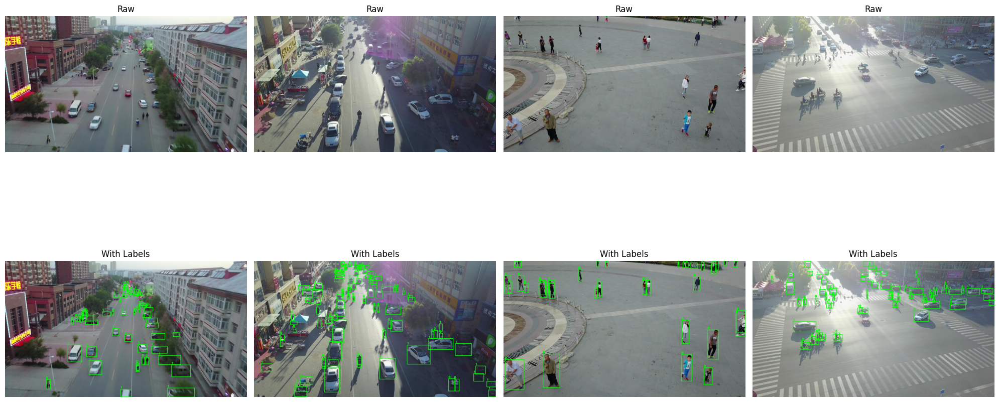

In [34]:
plot_dataset_images(
    dir_paths['val_img'],
    dir_paths['val_labels'],
    num_images=4
)

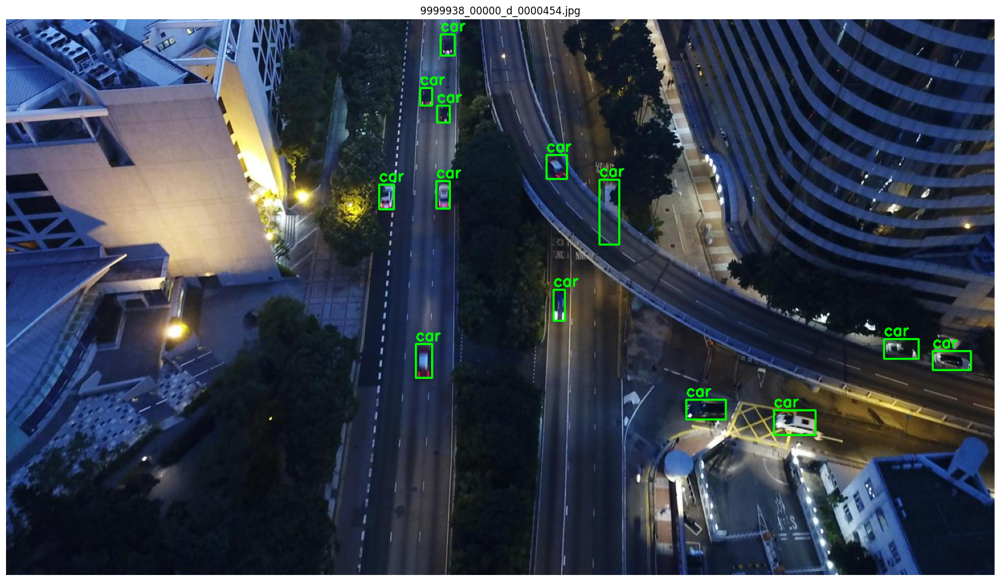

In [35]:
plot_random_image(dir_paths['test_img'], dir_paths['test_labels'], new_classes)

In [37]:
with open(Path(ROOT_DIR, "configs", "ds_config.yaml"), "r", encoding="utf-8") as f:
    ds_export = yaml.safe_load(f)
print("configs/ds_config.yaml:")
print(yaml.dump(ds_export, sort_keys=False))


configs/ds_config.yaml:
path: .dataset/VisDrone_Dataset
train: VisDrone2019-DET-train/images
val: VisDrone2019-DET-val/images
test: VisDrone2019-DET-test-dev/images
nc: 2
names:
  0: human
  1: car
cleaning:
  clip_coords: true
  convert_to_obb: true



*****
# Label Cleaning & OBB Conversion (train / val / test)

- clip coords → [0, 1]
- HBB → OBB (9 values per line for `yolo*-obb.pt`)


In [43]:
def _load_cleaning_cfg():
    with open(Path(ROOT_DIR, "configs", "ds_config.yaml"), "r", encoding="utf-8") as f:
        return yaml.safe_load(f).get("cleaning", {})

OBB_CFG = _load_cleaning_cfg()
print("OBB CFG:", OBB_CFG)

OBB CFG: {'clip_coords': True, 'convert_to_obb': True}


In [39]:
def clip01(v):
    return min(max(float(v), 0.0), 1.0)

def parse_label_line(line):
    p = line.strip().split()
    if len(p) == 5:
        return int(p[0]), list(map(float, p[1:]))
    if len(p) == 9:
        return int(p[0]), list(map(float, p[1:]))
    return None

def hbb_to_obb_line(cls, cx, cy, w, h, clip=True):
    x1, y1 = cx - w / 2, cy - h / 2
    x2, y2 = cx + w / 2, cy - h / 2
    x3, y3 = cx + w / 2, cy + h / 2
    x4, y4 = cx - w / 2, cy + h / 2
    if clip:
        x1, y1, x2, y2 = clip01(x1), clip01(y1), clip01(x2), clip01(y2)
        x3, y3, x4, y4 = clip01(x3), clip01(y3), clip01(x4), clip01(y4)
    return f"{cls} {x1:.6f} {y1:.6f} {x2:.6f} {y2:.6f} {x3:.6f} {y3:.6f} {x4:.6f} {y4:.6f}"


In [40]:
def convert_label_file(label_path, cfg):
    """Convert labels to OBB; keep every box (no deletion)."""
    clip = bool(cfg.get("clip_coords", True))
    to_obb = bool(cfg.get("convert_to_obb", True))
    out = []
    for line in label_path.read_text(encoding="utf-8").splitlines():
        item = parse_label_line(line)
        if not item:
            continue
        cls, coords = item
        if len(coords) == 4:
            cx, cy, w, h = coords
            if clip:
                cx, cy, w, h = clip01(cx), clip01(cy), min(w, 1.0), min(h, 1.0)
            if to_obb:
                out.append(hbb_to_obb_line(cls, cx, cy, w, h, clip))
            else:
                out.append(f"{cls} {cx:.6f} {cy:.6f} {w:.6f} {h:.6f}")
        elif to_obb:
            if clip:
                coords = [clip01(c) for c in coords]
            out.append(f"{cls} " + " ".join(f"{c:.6f}" for c in coords))
        else:
            xs, ys = coords[0::2], coords[1::2]
            x1, x2, y1, y2 = min(xs), max(xs), min(ys), max(ys)
            w, h = x2 - x1, y2 - y1
            cx, cy = x1 + w / 2, y1 + h / 2
            out.append(f"{cls} {cx:.6f} {cy:.6f} {w:.6f} {h:.6f}")
    return out

In [44]:
def convert_split(split_name, label_dir, cfg):
    label_dir = Path(label_dir)
    n_files, n_boxes = 0, 0
    for txt in tqdm(sorted(label_dir.glob("*.txt")), desc=f"OBB {split_name}"):
        lines = convert_label_file(txt, cfg)
        n_files += 1
        n_boxes += len(lines)
        txt.write_text("\n".join(lines) + ("\n" if lines else ""), encoding="utf-8")
    return {"files": n_files, "boxes": n_boxes}

conversion_report = {}
for split_name, lk in [
    ("train", "train_labels"),
    ("val", "val_labels"),
    ("test", "test_labels"),
]:
    conversion_report[split_name] = convert_split(split_name, dir_paths[lk], OBB_CFG)
    print(split_name, conversion_report[split_name])


OBB train: 100%|██████████| 6471/6471 [00:06<00:00, 1043.65it/s]


train {'files': 6471, 'boxes': 343205}


OBB val: 100%|██████████| 548/548 [00:00<00:00, 1382.49it/s]


val {'files': 548, 'boxes': 38759}


OBB test: 100%|██████████| 1610/1610 [00:13<00:00, 116.44it/s]

test {'files': 1610, 'boxes': 75102}


In [45]:
for split, key in [("train", "train_labels"), ("val", "val_labels"), ("test", "test_labels")]:
    n5 = n9 = 0
    for f in list(dir_paths[key].glob("*.txt"))[:30]:
        for line in f.read_text(encoding="utf-8").splitlines():
            n = len(line.split())
            n5 += (n == 5)
            n9 += (n == 9)
    print(f"{split}: HBB={n5}, OBB={n9} (30-file sample)")

train: HBB=0, OBB=1967 (30-file sample)
val: HBB=0, OBB=1430 (30-file sample)
test: HBB=0, OBB=1478 (30-file sample)


In [47]:
def plot_dataset_images_obb(img_path, label_path, class_names, num_images=4):
    image_files = random.sample(list(img_path.iterdir()), num_images)

    fig, axes = plt.subplots(2, num_images, figsize=(5 * num_images, 12))

    for i, img_file in enumerate(image_files):
        # ---------------- RAW IMAGE ----------------
        image = cv2.imread(str(img_file))
        raw_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        axes[0, i].imshow(raw_img)
        axes[0, i].set_title("Raw")
        axes[0, i].axis("off")

        # ---------------- IMAGE WITH OBB LABEL ----------------
        boxed_img = image.copy()
        h_img, w_img = boxed_img.shape[:2]

        label_file = label_path / f"{img_file.stem}.txt"
        if label_file.exists():
            with open(label_file, "r") as f:
                lines = f.readlines()

            for line in lines:
                parts = line.strip().split()
                if len(parts) != 9:          # class + 8 coords
                    continue

                cls_id = int(float(parts[0]))
                coords = list(map(float, parts[1:]))   # [x1,y1,x2,y2,x3,y3,x4,y4]

                # Scale normalised coords → pixel coords and reshape to (4,2)
                pts = np.array([
                    [coords[0] * w_img, coords[1] * h_img],  # top-left
                    [coords[2] * w_img, coords[3] * h_img],  # top-right
                    [coords[4] * w_img, coords[5] * h_img],  # bottom-right
                    [coords[6] * w_img, coords[7] * h_img],  # bottom-left
                ], dtype=np.int32)

                # Draw rotated polygon and class label
                cv2.polylines(boxed_img, [pts], isClosed=True, color=(0, 255, 0), thickness=2)
                cv2.putText(
                    boxed_img, class_names[cls_id],
                    (pts[0][0], max(pts[0][1] - 5, 0)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2
                )

        boxed_img = cv2.cvtColor(boxed_img, cv2.COLOR_BGR2RGB)
        axes[1, i].imshow(boxed_img)
        axes[1, i].set_title("With OBB Labels")
        axes[1, i].axis("off")

    plt.tight_layout()
    plt.show()

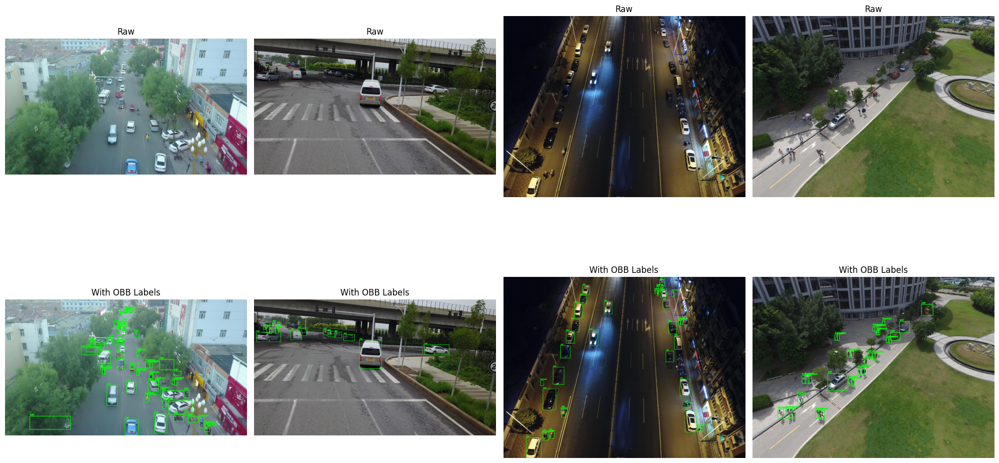

In [48]:
plot_dataset_images_obb(dir_paths['train_img'], dir_paths['train_labels'], new_classes)